# CALIBRATION

To analyze the level of ignition of each single LED it is first of all necessary to calibrate the software in order to identify the area to be controlled.

Each LED must be correctly identified and catalogued to determine the maximum light intensity and the image area it occupies.

Eventualities to take into account:
    - all 16 LEDs must be found in the calibration file
    - there must not be overlapping areas of separate LEDs
    - check that the image is not saturated

### 1 Importing libraries

In [1]:
import numpy as np
import os
import glob
import cv2 as cv
from matplotlib import pyplot as plt

from scipy.ndimage import median_filter
from sklearn.cluster import KMeans
from scipy.ndimage import gaussian_filter

### 2 Loading images file .npy

In [2]:
# saturation values
SAT_VALUE     = 4095
SAT_THRESHOLD = 0.01                       # warning se > 1 % dei pixel è saturo

# erosion of ROIs to achieve the number we want
TARGET_ROIS    = 16
MAX_ITERATIONS = 20


#imgs = np.load("CalibImagesF2_Float62.npy")                     # no saturation, LEDs overlay
#imgs = np.load("CalibImagesFloat62.npy")                        # saturation, no LEDs overlay
directory = "data"
percorsi_file = sorted(glob.glob(os.path.join(directory, "*.npy")))

imgs_dict = {}
for f in percorsi_file:
    nome = os.path.splitext(os.path.basename(f))[0]  # nome file senza estensione
    imgs_dict[nome] = np.load(f)

#imgs = imgs_dict["CalibImagesFloat62"]
imgs = imgs_dict["LEDs_ON"]
imgs = imgs/16                                                  # se immagine è UINT16
print(f"Loaded: dtype={imgs.dtype}, shape={imgs.shape}")

Loaded: dtype=float64, shape=(30, 1100, 1600)


### 3 Useful functions

Function to show the images contained in the list passed as an argument

In [3]:
def show_images(img_list, title='PHOTOS', vmax=None):
    n = len(img_list)
    fig, axes = plt.subplots(n, 1, figsize=(10, n * 8))
    axes = np.array(axes).flatten()
    plt.suptitle(title, fontsize=20)
    for i, img in enumerate(img_list):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f'Photo {i}', fontsize=12)
        axes[i].axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

Function to show images' histograms

In [4]:
def show_hist(img_list):
    n = len(img_list)
    cols = 3
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))
    plt.suptitle('Istogrammi', fontsize=20)
    axes = axes.flatten()
    for i, img in enumerate(img_list):
        ax = axes[i]
        # appiattisce l’immagine in un vettore di pixel
        pixels = img.ravel().astype(np.float64)
        # calcolo istogramma (divide il range tra min e max in 256 intervalli)
        counts, bin_edges = np.histogram(pixels, bins=256, range=(pixels.min(), pixels.max()))
        counts_norm = counts / counts.sum() # normalizzazione frequenze
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2 # centro dei bin
        ax.plot(bin_centers, counts_norm, color='steelblue', linewidth=1)
        ax.fill_between(bin_centers, counts_norm, alpha=0.3, color='steelblue')
        # media e deviazione standard
        mean, std = pixels.mean(), pixels.std()

        ax.axvline(mean, color='red', linewidth=1.5, linestyle='--', label=f'μ={mean:.1f}')
        ax.axvline(mean + std, color='orange', linewidth=1, linestyle=':')
        ax.axvline(mean - std, color='orange', linewidth=1, linestyle=':', label=f'σ={std:.1f}')
        ax.set_title(f'Photo {i}', fontsize=11)
        ax.set_xlabel('Valore pixel', fontsize=9)
        ax.set_ylabel('Frequenza relativa', fontsize=9)
        ax.set_xlim(pixels.min(), pixels.max())
        ax.tick_params(labelsize=8)
        ax.legend(fontsize=9)
        
    for j in range(n, len(axes)):
        axes[j].set_visible(False)
        
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

Function to show Min, Max and Mean

In [5]:
def show_stats(img_list):
    print(f"{'Photo':<10} {'Min':>10} {'Max':>10} {'Mean':>10} {'Std':>10}")
    print("-" * 52)
    for i, img in enumerate(img_list):
        p = img.ravel().astype(np.float64)
        print(f"{i:<10} {p.min():>10.2f} {p.max():>10.2f} {p.mean():>10.2f} {p.std():>10.2f}")
        #formattazione:
        # <10 = allineato a sinistra (colonna Photo)
        # >10.2f = float con 2 decimali, allineato a destra stessa cosa

KMeans to separate clusters of img_LEDs and img_no_LEDs photos (to use only if they are in the same .npy file)

In [6]:
def split_leds(img_list):
    # Calcola le std di tutte le immagini
    stds = np.array([img.ravel().astype(np.float64).std() for img in img_list])
    # Trova la soglia come punto di minimo nella distribuzione delle std (kmeans con 2 cluster)
    kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
    kmeans.fit(stds.reshape(-1, 1))
    # La soglia è il punto medio tra i due centroidi
    c1, c2 = sorted(kmeans.cluster_centers_.flatten())
    threshold_auto = (c1 + c2) / 2
    print(f"Std per immagine: {np.round(stds, 1)}")
    print(f"Centroidi: {c1:.1f} (spente), {c2:.1f} (accese)")
    print(f"Soglia automatica: {threshold_auto:.1f}")
    # immagini che verranno processate (solo quelle con i LED accesi)
    img_LEDs = [img for img, s in zip(img_list, stds) if s > threshold_auto]
    print(f"Immagini con LED: {len(img_LEDs)}")
    # immagini per lo zero di riferimento
    img_no_LEDs = [img for img, s in zip(img_list, stds) if s <= threshold_auto]
    print(f"Immagini senza LED: {len(img_no_LEDs)}")

    return img_LEDs, img_no_LEDs

Function to show saturated pixels

In [7]:
def show_saturated(img_LEDs, SAT_VALUE, SAT_THRESHOLD, binary_masks_final=None, roi_list_final=None, label_maps=None):
    sat_images = []
    for i, img in enumerate(img_LEDs):
        img_norm = cv.normalize(img.astype(np.float32), None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
        img_rgb  = cv.cvtColor(img_norm, cv.COLOR_GRAY2RGB)

        if binary_masks_final is not None and roi_list_final is not None:
            mask = binary_masks_final[i]
            rois = roi_list_final[i]
            num_labels, labels_map, stats, centroids = cv.connectedComponentsWithStats(mask, connectivity=8)

            if label_maps is not None:
                labels_map = remap_labels_map(labels_map, label_maps[i])

            print(f"\n=== Photo {i} ===")
            for roi in rois:
                label = roi['label']
                roi_pixel_mask   = (labels_map == label)
                saturated_mask   = roi_pixel_mask & (img >= SAT_VALUE)
                img_rgb[saturated_mask, 0] = 255
                img_rgb[saturated_mask, 1] = 0
                img_rgb[saturated_mask, 2] = 0
                total_pixels = int(np.sum(roi_pixel_mask))
                sat_pct = saturated_mask.sum() / total_pixels * 100 if total_pixels > 0 else 0.0
                status  = "WARNING" if sat_pct > SAT_THRESHOLD * 100 else "OK"
                print(f"  ROI {label} — {sat_pct:.3f}% saturi  {status}")
                cv.rectangle(img_rgb, (roi['x'], roi['y']), (roi['x'] + roi['w'], roi['y'] + roi['h']), (0, 255, 0), 2)
                cv.putText(img_rgb, str(roi['label']), (int(roi['x']), int(roi['y'] - 3)),
                           cv.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        else:
            saturated_mask = img >= SAT_VALUE
            img_rgb[saturated_mask, 0] = 255
            img_rgb[saturated_mask, 1] = 0
            img_rgb[saturated_mask, 2] = 0
            sat_pct = saturated_mask.sum() / img.size * 100
            status  = "WARNING" if sat_pct > SAT_THRESHOLD * 100 else "OK"
            print(f"Photo {i} — {sat_pct:.3f}% saturi  {status}")

        sat_images.append(img_rgb)

    title = 'Pixel saturi per ROI (rosso) con bounding box' if roi_list_final is not None else 'Pixel saturi evidenziati in rosso'
    show_images(sat_images, title=title)
    return sat_images

Function to find all the ROIs inside each image and to erode them in order to have 16 ROIs

In [8]:
def find_and_refine_rois(masked_images, images_filtered_gaussian, MAX_ITERATIONS, TARGET_ROIS=16):
    roi_list = []          # lista di liste: per ogni immagine, la lista delle ROI trovate
    binary_masks = []      # maschere binarie iniziali (servono per l'eventuale riduzione)

    for i, img in enumerate(masked_images):
        # Converti in uint8 per connectedComponents
        img_8bit = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)

        # Binarizza (i pixel già mascherati sono 0, gli altri > 0)
        _, binary = cv.threshold(img_8bit, 1, 255, cv.THRESH_BINARY)
        binary_masks.append(binary)

        # Flood fill tramite connectedComponentsWithStats
        num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(binary, connectivity=8)

        # Label 0 è il background, le ROI partono da 1
        num_rois = num_labels - 1
        print(f"Photo {i} — ROI trovate: {num_rois} {'Correct calibration frame' if num_rois == TARGET_ROIS else 'WRONG NUMBER OF LEDs'}")

        # Salva le ROI (stats escludendo il background)
        rois = []
        for label in range(1, num_labels):
            x, y, w, h, area = stats[label]
            cx, cy = centroids[label]
            rois.append({'label': label, 'x': x, 'y': y, 'w': w, 'h': h, 'area': area, 'cx': cx, 'cy': cy})

        roi_list.append(rois)

    # RIDUZIONE MASCHERE ROI (solo dove non sono state trovate 16 ROI)
    binary_masks_final = []
    roi_list_final = []

    for i, (mask, img) in enumerate(zip(binary_masks, images_filtered_gaussian)):
        # se questa immagine ha già 16 ROI, non serve erosione: mantieni i valori originali
        if len(roi_list[i]) == TARGET_ROIS:
            binary_masks_final.append(mask)
            roi_list_final.append(roi_list[i])
            continue

        current_mask = mask.copy()
        kernel       = cv.getStructuringElement(cv.MORPH_ELLIPSE, (3, 3))
        prev_mask    = current_mask.copy()
        for it in range(MAX_ITERATIONS):
            prev_mask    = current_mask.copy()
            current_mask = cv.erode(current_mask, kernel, iterations=1)
            num_labels, _, stats, centroids = cv.connectedComponentsWithStats(current_mask, connectivity=8)
            n_rois = num_labels - 1
            print(f"  Photo {i}: ciclo {it+1:3d} -> {n_rois} ROI")
            if n_rois == TARGET_ROIS:
                print(f"Photo {i}: 16 ROI raggiunte")
                break
        else:
            print(f"Photo {i}: Limite iterazioni raggiunto, ROI finali: {n_rois}")

        rois = []
        for label in range(1, num_labels):
            x, y, w, h, area = stats[label]
            cx, cy = centroids[label]
            rois.append({'label': label, 'x': x, 'y': y, 'w': w, 'h': h, 'area': area, 'cx': cx, 'cy': cy})

        binary_masks_final.append(current_mask)
        roi_list_final.append(rois)

    return roi_list_final, binary_masks_final

Function to relabel rois to respect the correct functioning order of the LEDs:

13  9   5  1

14  10  6  2

15  11  7  3

16  12  8  4

In [9]:
def relabel_rois_grid(roi_list_final, n_rows=4, n_cols=4):
    new_roi_list = []
    label_maps = []  # una mappatura {vecchio_id: nuovo_id} per ogni immagine

    for rois in roi_list_final:
        rois = list(rois)
        if len(rois) != n_rows * n_cols:
            print(f"Attenzione: trovate {len(rois)} ROI invece di {n_rows*n_cols}")

        cx = np.array([r['cx'] for r in rois])
        cy = np.array([r['cy'] for r in rois])

        x_sorted_idx = np.argsort(cx)
        col_bins = np.array_split(x_sorted_idx, n_cols)
        col_of = np.zeros(len(rois), dtype=int)
        for col_index, idxs in enumerate(col_bins):
            col_of[idxs] = col_index

        y_sorted_idx = np.argsort(cy)
        row_bins = np.array_split(y_sorted_idx, n_rows)
        row_of = np.zeros(len(rois), dtype=int)
        for row_index, idxs in enumerate(row_bins):
            row_of[idxs] = row_index

        mapping = {}
        for i, roi in enumerate(rois):
            col_index = col_of[i]
            row_index = row_of[i]
            old_id = roi['label']
            new_id = (n_cols - 1 - col_index) * n_rows + row_index + 1
            mapping[old_id] = new_id
            roi['label'] = new_id

        rois.sort(key=lambda r: r['label'])
        new_roi_list.append(rois)
        label_maps.append(mapping)

    return new_roi_list, label_maps

In [10]:
def remap_labels_map(labels_map, mapping):
    """Sostituisce i vecchi id dei componenti connessi con i nuovi, pixel per pixel."""
    new_labels_map = np.zeros_like(labels_map)
    for old_id, new_id in mapping.items():
        new_labels_map[labels_map == old_id] = new_id
    return new_labels_map

Function to compute zero (sum of all pixels inside each ROI) from the image achieved with the mean of all LEDs_ON images

In [11]:
def compute_zero(img_no_LEDs, binary_masks_final, roi_list_final):
    # 1) Immagine media dalle foto a LED spenti
    mean_dark_img = np.mean(np.stack(img_no_LEDs, axis=0), axis=0)  # shape (H, W), float64
    # 2) Maschera e ROI di riferimento
    reference_mask = binary_masks_final[0]   # uint8, 0/255
    reference_rois = roi_list_final[0]
    print(f"Immagine media calcolata su {len(img_no_LEDs)} foto a LED spenti")
    print(f"ROI di riferimento: {len(reference_rois)} (da Photo 0)\n")
    # 3) Zero di riferimento per ogni ROI = SOMMA dei pixel dentro la maschera
    print(f"{'ROI':<6} {'Zero di riferimento':>15} {'N pixel':>10}  Posizione (cx, cy)")
    print("─" * 60)
    ref_zero = []
    for roi in reference_rois:
        # estrae coordinate e dimensioni del bounding box della ROI
        x, y, w, h = roi['x'], roi['y'], roi['w'], roi['h']
        # ritaglia dall'immagine media (LED spenti) il rettangolo corrispondente alla ROI
        patch      = mean_dark_img[y:y+h, x:x+w]
        # ritaglia la stessa regione dalla maschera binaria di riferimento
        mask_patch = reference_mask[y:y+h, x:x+w]
        # converte la maschera in booleano: True dove il pixel appartiene effettivamente alla ROI (non solo al bounding box rettangolare)
        pixel_mask = mask_patch > 0
        n_pixel    = np.sum(pixel_mask)
        # somma i valori dei soli pixel mascherati, "zero di riferimento" per la ROI
        sum_zero   = np.sum(patch[pixel_mask])

        ref_zero.append({
            'label': roi['label'],
            'cx': roi['cx'], 'cy': roi['cy'],
            'zero': sum_zero,
            'n_pixel': n_pixel
        })

        print(f"{roi['label']:<6} {sum_zero:>15.3f} {n_pixel:>10d}  ({roi['cx']:.1f}, {roi['cy']:.1f})")

    return ref_zero

Function to compute zero or max value, differently from the previous function it computes a sum inside each ROI and then a mean and std for each ROI in different images

In [12]:
def compute_roi_stats(images, binary_masks_final, roi_list_final, tipo='zero'):

    if tipo == 'zero':
        label_foto   = "Numero foto a LED spenti"
        chiave_val   = 'zero'
        header_val   = 'Zero di riferimento'
    elif tipo == 'segnale':
        label_foto   = "Numero foto a LED accesi"
        chiave_val   = 'segnale'
        header_val   = 'Valore Massimo'
    else:
        raise ValueError("tipo deve essere 'zero' o 'segnale'")

    # 1) Maschera e ROI di riferimento (stesse ROI, posizione fisica dei LED invariata)
    reference_mask = binary_masks_final[0]   # uint8, 0/255
    reference_rois = roi_list_final[0]
    print(f"{label_foto}: {len(images)}")
    print(f"ROI di riferimento: {len(reference_rois)} (da Photo 0)\n")

    # 2) Somma dei pixel per ogni ROI, per ogni singola immagine
    somma_per_roi = {roi['label']: [] for roi in reference_rois}
    for img_idx, img in enumerate(images):
        for roi in reference_rois:
            x, y, w, h = roi['x'], roi['y'], roi['w'], roi['h']
            label = roi['label']
            # ritaglia dall'immagine corrente il rettangolo della ROI
            patch      = img[y:y+h, x:x+w].astype(np.float64)
            # ritaglia la stessa regione dalla maschera binaria di riferimento
            mask_patch = reference_mask[y:y+h, x:x+w]
            pixel_mask = mask_patch > 0
            sum_val = np.sum(patch[pixel_mask])
            somma_per_roi[label].append(sum_val)

    # 3) Media e std per ogni ROI (calcolate sulle N immagini)
    risultati = []
    std_roi   = []
    print(f"{'ROI':<6} {header_val:>15} {'Std':>15} {'N pixel':>10}  Posizione (cx, cy)")
    print("─" * 70)
    for roi in reference_rois:
        label      = roi['label']
        valori     = np.array(somma_per_roi[label])   # valori della ROI su tutte le immagini
        x, y, w, h = roi['x'], roi['y'], roi['w'], roi['h']
        mask_patch = reference_mask[y:y+h, x:x+w]
        n_pixel    = int(np.sum(mask_patch > 0))
        media_val  = np.mean(valori)
        standard_dev = np.std(valori)

        risultati.append({
            'label': label,
            'cx': roi['cx'], 'cy': roi['cy'],
            chiave_val: media_val,
            'n_pixel': n_pixel,
            'n_immagini': len(valori)
        })
        std_roi.append({
            'label': label,
            'std': standard_dev
        })

        print(f"{label:<6} {media_val:>15.3f} {standard_dev:>15.3f} {n_pixel:>10d}  ({roi['cx']:.1f}, {roi['cy']:.1f})")

    return risultati, std_roi

Function to save calibration data inside a .txt file. Each row of the file will contain zero, std_zero, max, std_max

In [13]:
def save_calib_data(res_zero, std_zero, res_max, std_max,
                     filename='calib_data.txt'):
    """
    Salva su file (sovrascrivendo se esiste) una riga per ogni ROI con:
    ref_zero  std_zero_roi  segnale_max  std_segnale_roi
    """
    # cartella corrente del notebook
    cartella = os.getcwd()
    filepath = os.path.join(cartella, filename)

    # indicizzo std per label, per essere sicuro dell'abbinamento corretto
    std_zero_map     = {d['label']: d['std'] for d in std_zero}
    std_max_map  = {d['label']: d['std'] for d in std_max}
    max_map      = {d['label']: d['segnale'] for d in res_max}

    with open(filepath, 'w') as f:
        for r in res_zero:
            label = r['label']
            ref_zero        = r['zero']
            std_zero_roi    = std_zero_map[label]
            segnale_max     = max_map[label]
            std_segnale_roi = std_max_map[label]

            f.write(f"{ref_zero} {std_zero_roi} {segnale_max} {std_segnale_roi}\n")

    print(f"Dati salvati in: {filepath}")

In [14]:
def save_image(image, filename):
    cartella = os.getcwd()
    filepath = os.path.join(cartella, filename)

    if image.ndim == 3 and image.shape[2] == 3:
        image_to_save = cv.cvtColor(image, cv.COLOR_RGB2BGR)
    else:
        image_to_save = image

    cv.imwrite(filepath, image_to_save)
    print(f"Immagine salvata in: {filepath}")

### 4 Images Check

In [15]:
img_list = [imgs[i].astype(np.uint16) for i in range(imgs.shape[0])]

In [16]:
#show_images(img_list, title='Immagini originali')

Histograms of each single image to identify the distribution of pixel values, mean and standard deviation are also indicated

In [17]:
#show_hist(img_list)

Stampa per ogni immagine:
- i -> indice immagine
- p.min() -> valore minimo pixel
- p.max() -> valore massimo pixel
- p.mean() -> media intensità pixel
- p.std() -> deviazione standard (variabilità)

In [18]:
show_stats(img_list)

Photo             Min        Max       Mean        Std
----------------------------------------------------
0              109.00    4095.00     295.83     444.42
1              119.00    4095.00     295.81     444.67
2              114.00    4095.00     295.84     444.57
3              120.00    4095.00     295.72     444.63
4              117.00    4095.00     295.79     444.68
5              111.00    4095.00     295.76     444.55
6              109.00    4095.00     295.87     444.66
7              118.00    4095.00     295.73     444.56
8              103.00    4095.00     295.75     444.49
9              111.00    4095.00     295.70     444.70
10             130.00    4095.00     295.79     444.61
11             110.00    4095.00     295.67     444.56
12             119.00    4095.00     295.74     444.61
13             121.00    4095.00     295.71     444.51
14             123.00    4095.00     295.79     444.68
15             121.00    4095.00     295.79     444.48
16          

If we have both LEDs on and LEDs off images in the same set, we can see that while the average remains almost stable in all photos, the standard deviation is much higher in photos containing the LEDs turned on.

### 5 Filtering and Warnings

Take only images with std higher than 300

K-Means Clustering is an unsupervised clustering algorithm that:
- takes the data (here: the standard deviations of the images)
- decides how many groups you want (here: n_clusters=2)
- splits the data into 2 groups by minimizing the within-cluster distance

The algorithm groups similar std by starting from randomly initialized centroids and iteratively refining them by assigning each std to the nearest centroid and recomputing the centroid of each cluster. This process continues until the within-cluster sum of squared distances is minimized and the clustering converges.

In [19]:
#img_list = [img for img in img_list if img.ravel().astype(np.float64).std() > 300]

In [20]:
print(list(imgs_dict.keys())[:5])  # nomi reali delle chiavi

['LEDs_OFF', 'LEDs_ON']


In [21]:
if "LEDs_OFF" in imgs_dict:
    # dividi per 16 subito, sia ON che OFF, una sola volta
    stack_on  = imgs_dict["LEDs_ON"]  / 16
    stack_off = imgs_dict["LEDs_OFF"] / 16

    img_no_LEDs = [stack_off[i] for i in range(stack_off.shape[0])] if stack_off.ndim == 3 else [stack_off]
    img_LEDs    = [stack_on[i]  for i in range(stack_on.shape[0])]

    print("Trovato 'LEDs_OFF.npy', uso quello come riferimento senza LED.")
else:
    img_LEDs, img_no_LEDs = split_leds(img_list)
    img_LEDs    = [img / 16 for img in img_LEDs]
    img_no_LEDs = [img / 16 for img in img_no_LEDs]

print(f"Numero frame LEDs_ON: {len(img_LEDs)}, shape singolo frame: {img_LEDs[0].shape}, dtype: {img_LEDs[0].dtype}")

Trovato 'LEDs_OFF.npy', uso quello come riferimento senza LED.
Numero frame LEDs_ON: 30, shape singolo frame: (1100, 1600), dtype: float64


##### (De-activated)
Images may contain sensor noise and small intensity fluctuations. A median filter is applied in order to remove mpulsive noise while preserving edges.

In [22]:
#images_filtered = [median_filter(img, size=7).astype(np.uint16) for img in img_list]
#show_images(images_filtered, title='Immagini filtrate (median 7x7)')

#### SATURATION WARNING

Controllare la percentuale di pixel saturi nelle immagini ottenute dal KMeans. Se la saturazione è sopra il 10% del totale dei pixel, visualizzare un warning

In [23]:
print(f"{'Photo':<10} {'Sat. pixels':>14} {'Tot. pixels':>14} {'Sat. %':>10}  Status")
print("─" * 60)

for i, img in enumerate(img_LEDs):
    total_pixels     = img.size
    saturated_pixels = int(np.sum(img >= SAT_VALUE))
    sat_pct          = saturated_pixels / total_pixels * 100

    status = "WARNING - saturazione elevata!" if sat_pct > SAT_THRESHOLD * 100 else "OK"

    print(f"{i:<10} {saturated_pixels:>14d} {total_pixels:>14d} {sat_pct:>9.3f}%  {status}")

Photo         Sat. pixels    Tot. pixels     Sat. %  Status
────────────────────────────────────────────────────────────
0                       7        1760000     0.000%  OK
1                       7        1760000     0.000%  OK
2                       6        1760000     0.000%  OK
3                       5        1760000     0.000%  OK
4                       6        1760000     0.000%  OK
5                       4        1760000     0.000%  OK
6                       5        1760000     0.000%  OK
7                       8        1760000     0.000%  OK
8                       7        1760000     0.000%  OK
9                       6        1760000     0.000%  OK
10                      5        1760000     0.000%  OK
11                      6        1760000     0.000%  OK
12                      3        1760000     0.000%  OK
13                      6        1760000     0.000%  OK
14                      2        1760000     0.000%  OK
15                      6        176000

In [24]:
#sat_images = show_saturated(img_LEDs, SAT_VALUE, SAT_THRESHOLD)

In [25]:
images_filtered = [
    cv.bilateralFilter(img.astype(np.float32), d=9, sigmaColor=150, sigmaSpace=75).astype(np.uint16)
    for img in img_LEDs
]

#show_images(images_filtered, title='Immagini filtrate (bilateral)')

In [26]:
# Apply Gaussian blur to the already median-filtered images
images_filtered_gaussian = [gaussian_filter(img.astype(np.uint16), sigma=2) for img in images_filtered]

# N.B.: più è alto il sigma, più grande è l'area del kernel

#show_images(images_filtered_gaussian, title='Immagini filtrate (median 7x7 + gaussian blur σ=2)')

In [27]:
show_stats(images_filtered_gaussian)

Photo             Min        Max       Mean        Std
----------------------------------------------------
0              194.00    3883.00     294.23     440.63
1              194.00    3910.00     294.20     440.86
2              194.00    3891.00     294.23     440.77
3              194.00    3866.00     294.11     440.82
4              194.00    3891.00     294.18     440.89
5              195.00    3893.00     294.15     440.75
6              194.00    3883.00     294.26     440.87
7              195.00    3897.00     294.12     440.75
8              195.00    3893.00     294.14     440.69
9              195.00    3891.00     294.09     440.90
10             194.00    3885.00     294.18     440.82
11             195.00    3885.00     294.07     440.78
12             195.00    3894.00     294.13     440.81
13             195.00    3897.00     294.10     440.70
14             194.00    3892.00     294.18     440.89
15             194.00    3902.00     294.18     440.69
16          

### 6 Otsu Thresholding

To separate the LEDs from the background, the images are binarized using Otsu’s method.  
Otsu’s method is preferable to manual thresholding because it automatically selects a threshold that maximizes the separation between foreground and background.

The correct threshold is identified as follows.


Given:
- i = 1,...,L gray levels
- N number of pixels
- h(i): $i^{th}$ entry of image histogram
- p(i) = $\frac{i}{N}$ probability of gray lvl i

And also mean and variance:
$$
\mu = \sum_{i=1}^{L} i*p(i)
$$
$$
\sigma^2 = \sum_{i=1}^{L} (i - \mu)^2*p(i)
$$

The mean can be thought of as the expectation of i, while the variance as the expectation of square error from mean.

The threshold will split two regions: a "bright" region and a "dark" region.

Mean of dark region:
$$
\mu_1 = \sum_{i=1}^{t} i \cdot \frac{h(i)}{N_1},
\qquad
\text{given t = threshold, and } N_1 = \sum_{i=1}^{t} h(i), \text{tot dark pixels}
$$
$$
\mu_1 = \sum_{i=1}^{t} i \cdot \frac{h(i)}{N_1} * \frac{N}{N} =
$$
$$
= \sum_{i=1}^{t} i \cdot \frac{h(i)}{N} * \frac{N}{N_1} =
\qquad
$$
$$
\text{we take } \frac{N_1}{N} = q_1 \text{ ---> } \frac{\sum_{i=1}^{t} h(i)}{N} = \sum_{i=1}^{t} p(i)
$$
$$
= \sum_{i=1}^{t} i \cdot \frac{i*p(i)}{q_1}
$$

Variance of dark region:
$$
\sigma_1^2= \sum_{i=1}^{t} \frac{(i - \mu)^2*p(i)}{q_1}
$$

We need to do this for each possible threshold:
$$
\mu_1(t)= \sum_{i=1}^{t} i \cdot \frac{i*p(i)}{q_1(t)}, 
\sigma_1(t)^2= \sum_{i=1}^{t} \frac{(i - \mu)^2*p(i)}{q_1(t)}
$$
$$
\mu_2(t)= \sum_{i=1}^{t} i \cdot \frac{i*p(i)}{q_2(t)}, 
\sigma_2(t)^2= \sum_{i=1}^{t} \frac{(i - \mu)^2*p(i)}{q_2(t)}
$$

Within-group variance of two regions is defined as:
$$
\sigma_w(t)^2 = q_1(t)*\sigma_1(t)^2 + q_2(t)*\sigma_2(t)^2
$$
It is the minimum when all pixel in dark/bright regions looks similar between pixels of same region

This produces an initial binary mask of the LEDs.

Photo 0 — threshold: 1419.0
Photo 1 — threshold: 1419.0
Photo 2 — threshold: 1419.0
Photo 3 — threshold: 1419.0
Photo 4 — threshold: 1420.0
Photo 5 — threshold: 1419.0
Photo 6 — threshold: 1420.0
Photo 7 — threshold: 1419.0
Photo 8 — threshold: 1418.0
Photo 9 — threshold: 1420.0
Photo 10 — threshold: 1419.0
Photo 11 — threshold: 1419.0
Photo 12 — threshold: 1419.0
Photo 13 — threshold: 1419.0
Photo 14 — threshold: 1420.0
Photo 15 — threshold: 1419.0
Photo 16 — threshold: 1420.0
Photo 17 — threshold: 1419.0
Photo 18 — threshold: 1419.0
Photo 19 — threshold: 1419.0
Photo 20 — threshold: 1419.0
Photo 21 — threshold: 1419.0
Photo 22 — threshold: 1419.0
Photo 23 — threshold: 1419.0
Photo 24 — threshold: 1419.0
Photo 25 — threshold: 1418.0
Photo 26 — threshold: 1420.0
Photo 27 — threshold: 1419.0
Photo 28 — threshold: 1420.0
Photo 29 — threshold: 1420.0


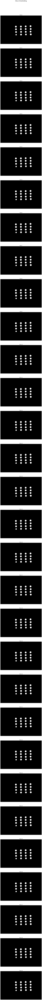

In [28]:
images_otsu = []
original_thresholds = []

for i, img in enumerate(images_filtered_gaussian):
    threshold, otsu_img = cv.threshold(img, 0, 4095, cv.THRESH_BINARY + cv.THRESH_OTSU)
    images_otsu.append(otsu_img)
    original_thresholds.append(threshold)
    print(f'Photo {i} — threshold: {threshold:.1f}')

show_images(images_otsu, title="Otsu's thresholding")

In [29]:
# Convert Otsu images to 8-bit masks (bitwise_and requires uint8 mask)
binary_masks = [(img > 0).astype(np.uint8) * 255 for img in images_otsu]

# Apply mask to each original image
masked_images = [cv.bitwise_and(img_LEDs[i], img_LEDs[i], mask=binary_masks[i]) 
                 for i in range(len(img_LEDs))]

#show_images(masked_images, title='Immagini con maschera Otsu applicate')

In [30]:
show_stats(masked_images)
# naturalmente le foto risulteranno ancora sature perchè la maschera è stata applicata alle immagini iniziali (non filtrate)

Photo             Min        Max       Mean        Std
----------------------------------------------------
0                0.00    4095.00      80.69     469.06
1                0.00    4095.00      80.73     469.32
2                0.00    4095.00      80.72     469.21
3                0.00    4095.00      80.73     469.26
4                0.00    4095.00      80.70     469.25
5                0.00    4095.00      80.72     469.18
6                0.00    4095.00      80.69     469.26
7                0.00    4095.00      80.72     469.19
8                0.00    4095.00      80.73     469.14
9                0.00    4095.00      80.70     469.28
10               0.00    4095.00      80.71     469.23
11               0.00    4095.00      80.71     469.18
12               0.00    4095.00      80.73     469.24
13               0.00    4095.00      80.72     469.15
14               0.00    4095.00      80.70     469.27
15               0.00    4095.00      80.71     469.11
16          

### 7 Flood Fill

To identify the different regions in the same image we assign a label to each pixel in order to define to which object it is from

In [31]:
roi_list_final, binary_masks_final = find_and_refine_rois(masked_images, images_filtered_gaussian, MAX_ITERATIONS)

roi_list_final, label_maps = relabel_rois_grid(roi_list_final, n_rows=4, n_cols=4)

Photo 0 — ROI trovate: 16 Correct calibration frame
Photo 1 — ROI trovate: 16 Correct calibration frame
Photo 2 — ROI trovate: 16 Correct calibration frame
Photo 3 — ROI trovate: 16 Correct calibration frame
Photo 4 — ROI trovate: 16 Correct calibration frame
Photo 5 — ROI trovate: 16 Correct calibration frame
Photo 6 — ROI trovate: 16 Correct calibration frame
Photo 7 — ROI trovate: 16 Correct calibration frame
Photo 8 — ROI trovate: 16 Correct calibration frame
Photo 9 — ROI trovate: 16 Correct calibration frame
Photo 10 — ROI trovate: 16 Correct calibration frame
Photo 11 — ROI trovate: 16 Correct calibration frame
Photo 12 — ROI trovate: 16 Correct calibration frame
Photo 13 — ROI trovate: 16 Correct calibration frame
Photo 14 — ROI trovate: 16 Correct calibration frame
Photo 15 — ROI trovate: 16 Correct calibration frame
Photo 16 — ROI trovate: 16 Correct calibration frame
Photo 17 — ROI trovate: 16 Correct calibration frame
Photo 18 — ROI trovate: 16 Correct calibration frame
Pho

##### N.B.
Con kernel (3,3) e iterations=1, ogni chiamata a cv.erode rimuove 1 pixel dal bordo di ogni ROI in tutte le direzioni (su, giù, sinistra, destra, e diagonali con connectivity=8).

Quindi dopo it iterazioni ogni ROI è rimpicciolita di it pixel su ogni lato, e la distanza tra due ROI adiacenti è aumentata di 2 * it pixel totali (un pixel per lato da ciascuna delle due ROI).

In [32]:
# Apply mask to each original image
masked_images = [cv.bitwise_and(img_LEDs[i], img_LEDs[i], mask=binary_masks_final[i]) 
                 for i in range(len(img_LEDs))]

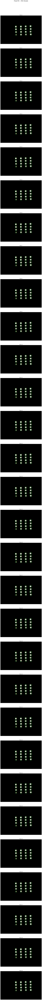

In [33]:
# Visualizza le immagini con le ROI evidenziate
roi_images = []
for i, (img, rois) in enumerate(zip(masked_images, roi_list_final)):
    img_display = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
    img_bgr     = cv.cvtColor(img_display, cv.COLOR_GRAY2BGR)

    for roi in rois:
        cv.rectangle(img_bgr, (roi['x'], roi['y']), (roi['x'] + roi['w'], roi['y'] + roi['h']), (0, 255, 0), 2)
        cv.putText(img_bgr, str(roi['label']), (int(roi['cx']), int(roi['cy'])),
                   cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

    roi_images.append(cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB))

show_images(roi_images, title='Flood Fill — ROI rilevate')

2) indicare quanto si sovrappongono
5) visualizzare pixel che sono in comune nelle zone led in diverse maschere

### 8 Saturazione in ogni ROI


=== Photo 0 ===
  ROI 1 — 0.000% saturi  OK
  ROI 2 — 0.000% saturi  OK
  ROI 3 — 0.000% saturi  OK
  ROI 4 — 0.000% saturi  OK
  ROI 5 — 0.000% saturi  OK
  ROI 6 — 0.000% saturi  OK
  ROI 7 — 0.000% saturi  OK
  ROI 8 — 0.000% saturi  OK
  ROI 9 — 0.109% saturi  OK
  ROI 10 — 0.085% saturi  OK
  ROI 11 — 0.000% saturi  OK
  ROI 12 — 0.000% saturi  OK
  ROI 13 — 0.000% saturi  OK
  ROI 14 — 0.000% saturi  OK
  ROI 15 — 0.000% saturi  OK
  ROI 16 — 0.000% saturi  OK

=== Photo 1 ===
  ROI 1 — 0.000% saturi  OK
  ROI 2 — 0.000% saturi  OK
  ROI 3 — 0.000% saturi  OK
  ROI 4 — 0.000% saturi  OK
  ROI 5 — 0.000% saturi  OK
  ROI 6 — 0.000% saturi  OK
  ROI 7 — 0.000% saturi  OK
  ROI 8 — 0.000% saturi  OK
  ROI 9 — 0.164% saturi  OK
  ROI 10 — 0.000% saturi  OK
  ROI 11 — 0.000% saturi  OK
  ROI 12 — 0.000% saturi  OK
  ROI 13 — 0.029% saturi  OK
  ROI 14 — 0.000% saturi  OK
  ROI 15 — 0.000% saturi  OK
  ROI 16 — 0.000% saturi  OK

=== Photo 2 ===
  ROI 1 — 0.000% saturi  OK
  ROI 2 — 0

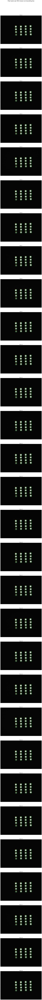

In [34]:
sat_images_roi = show_saturated(img_LEDs, SAT_VALUE, SAT_THRESHOLD, binary_masks_final, roi_list_final, label_maps)

### 9 Zero di riferimento

Dalle immagini a led spenti ottenere uno stack medio dei frame e trovare uno zero di riferimento per ogni ROI.
Applicare quindi la maschera ottenuta dalle immagini con i LED accesi (per semplicità viene usata la prima maschera individuata) e appliccarla alle immagini senza LED.
Media dei valori dei pixel in ogni ROI per ottenere lo zero.

In [35]:
#ref_zero = compute_zero(img_no_LEDs, binary_masks_final, roi_list_final)

In [36]:
ref_zero, std_zero_roi = compute_roi_stats(img_no_LEDs, binary_masks_final, roi_list_final, tipo='zero')

Numero foto a LED spenti: 30
ROI di riferimento: 16 (da Photo 0)

ROI    Zero di riferimento             Std    N pixel  Posizione (cx, cy)
──────────────────────────────────────────────────────────────────────
1           719622.600         806.419       3593  (1169.3, 412.2)
2           697607.233         880.481       3485  (1174.6, 521.0)
3           683432.833         920.645       3414  (1170.6, 623.4)
4           719983.300         743.814       3596  (1178.2, 728.5)
5           700975.067         758.100       3501  (980.7, 419.2)
6           665817.433         691.366       3328  (981.4, 522.0)
7           704724.433        1080.093       3520  (983.9, 631.2)
8           623111.567         819.580       3113  (990.1, 732.6)
9           732871.000         737.785       3660  (794.4, 425.7)
10          703565.600         769.175       3516  (793.4, 525.7)
11          695660.267        1061.093       3476  (800.9, 631.7)
12          667425.467         782.107       3334  (799.5, 

CALCOLO ZERO AGGIORNATO
1) per ogni immagine -> per ogni roi somma zeri
2) media di stesso roi in diverse immagini
3) calcolo varianza per ogni roi (valore da usare come soglia zero)

(stessa cosa per masssimo)

### 10 Valore Massimo

In [37]:
segnale_max, std_segnale_roi = compute_roi_stats(img_LEDs, binary_masks_final, roi_list_final, tipo='segnale')

Numero foto a LED accesi: 30
ROI di riferimento: 16 (da Photo 0)

ROI     Valore Massimo             Std    N pixel  Posizione (cx, cy)
──────────────────────────────────────────────────────────────────────
1         10022959.200       17244.698       3593  (1169.3, 412.2)
2          9272230.833        6234.642       3485  (1174.6, 521.0)
3          8600830.467        5508.520       3414  (1170.6, 623.4)
4          9774575.600        6519.855       3596  (1178.2, 728.5)
5          9653848.900        6434.391       3501  (980.7, 419.2)
6          8619505.433        5321.973       3328  (981.4, 522.0)
7          9369312.567        5939.571       3520  (983.9, 631.2)
8          7309396.967        6024.441       3113  (990.1, 732.6)
9         10630631.733        7314.844       3660  (794.4, 425.7)
10         9858077.333        6508.521       3516  (793.4, 525.7)
11         9496059.167        4405.462       3476  (800.9, 631.7)
12         8521962.100        5911.522       3334  (799.5, 736.

In [38]:
save_calib_data(ref_zero, std_zero_roi, segnale_max, std_segnale_roi)

Dati salvati in: /home/user/Desktop/calibration/calib_data.txt


In [39]:
save_image(binary_masks_final[0], 'reference_mask.png')
save_image(sat_images_roi[0], 'calibrated_frame.png')

Immagine salvata in: /home/user/Desktop/calibration/reference_mask.png
Immagine salvata in: /home/user/Desktop/calibration/calibrated_frame.png


calcolo valore led:
1) minimo e massimo calcolati sulle immagini originali sommando pixel in stesso roi (considera eventuale deviazione)
2) (valore pixel attuale - min)/(max-min)
3) bisogna trovare l'incertezza sul calcolo, non dovrebbe essere superiore a 1/50

Per convertire da terminale un notebook Jupyter a file .py

    file -> Save and export Notebook As -> Executable script

Genera calibration.py dove ogni cella diventa un blocco di codice separato da commenti # In[N]:. È il modo più veloce